## LATENT SPACE EXPLORATION

### Setup for AEv3.0

In [12]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import torch
import torch.nn as nn
import h5py
import numpy as np
import seaborn as sns
from tqdm import tqdm
from joblib import dump, load

In [4]:
device = torch.device('cuda')
# device = torch.device('cpu')

In [5]:
import os
os.chdir('/home/aisinai/work/repos/nis_patient_encoding/')

In [6]:
from data.data_loader import NISDatabase

from utils.experiments import *
from utils.feature_utils import calc_output_dims

from model.autoencoder.autoencoder import AutoEncoder
from model.autoencoder.loss import CustomLoss
# from trainer.trainer import Trainer

In [7]:
import umap
from cuml.manifold.umap import UMAP as cuUMAP

In [8]:
from sklearn.preprocessing import OrdinalEncoder

## New

In [9]:
from similarity.run_match import *

In [13]:
config_ts = json.load(open('similarity/savr_tavr.json', 'r'))
config_ts = init(config_ts)

ae = nn.DataParallel(load_model(config_ts)).to('cuda')

db = NISDatabase(config_ts['data']['model'], 'full')
db.set_batch_size(1000)

In [14]:
# import tsnecuda
import tables
from tqdm import tqdm

try:
    latent_space.close()
except:
    pass

latent_space = tables.open_file(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + 'latent_space_embedding.h5', 'w')

lsarr = latent_space.create_earray('/', 'ls', tables.Float32Atom(), (0, 64))

for samp_batch in tqdm(db.iterator):
    ls = ae.module.latent_representation(samp_batch.to('cuda')).detach().to('cpu').numpy()
    lsarr.append(ls)

latent_space.close()

ae.module.latent_representation(samp_batch.to('cuda')).shape

In [15]:
try:
    latent_space.close()
except:
    pass

latent_space = tables.open_file(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + 'latent_space_embedding.h5', 'r')

In [25]:
lsd = []
step = 10
for row in tqdm(latent_space.root.ls.iterrows(start=0, step=step), total=latent_space.root.ls.shape[0] / step):
    lsd.append(row)
    
lsd = np.array(lsd)

100%|██████████| 17369821/17369821.0 [02:35<00:00, 112017.72it/s]


In [ ]:
umap_model = umap.UMAP(n_neighbors).fit(lsd)

In [17]:
umap_model = cuUMAP(verbose=True, random_state=42)
umap_model.fit(lsd)
embeddings_f_t = umap_model.transform(lsd)

In [18]:
embeddings = cuUMAP(verbose=True, random_state=42).fit_transform(lsd)

In [58]:
def filter_percentile(data, p=[0.5, 99.5]):
    lb, ub = np.percentile(data, p)
    lower = data >= lb
    upper = data <= ub
    return lower * upper

def filter_embeddings_only(embedding):
    d1filt = filter_percentile(embedding[:, 0])
    d2filt = filter_percentile(embedding[:, 1])
    keep = d1filt * d2filt
    
    return embedding[keep, :]

def filter_embeddings(embedding, oc, rd):
    d1filt = filter_percentile(embedding[:, 0])
    d2filt = filter_percentile(embedding[:, 1])
    keep = d1filt * d2filt
    
    return embedding[keep, :], oc[keep], rd[keep]


In [ ]:
embeddings_f_t = filter_embeddings_only(embeddings_f_t)
embeddings = filter_embeddings_only(embeddings)

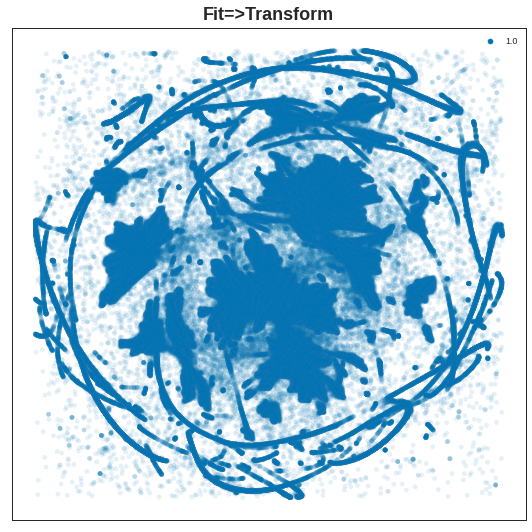

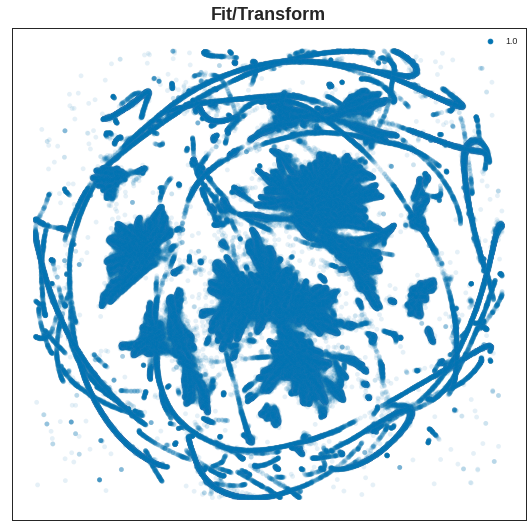

In [24]:
plot_latent_space(embeddings_f_t, np.ones((embeddings_f_t.shape[0], )), 'Fit=>Transform')
plot_latent_space(embeddings, np.ones((embeddings.shape[0], )), 'Fit/Transform')

In [ ]:
lsd = []
step = 1
for row in tqdm(latent_space.root.ls.iterrows(start=0, step=step), total=latent_space.root.ls.shape[0] / step):
    lsd.append(row)
    
lsd = np.array(lsd)

 10%|█         | 1813046/17369821.0 [00:23<17:10, 15090.33it/s] 

In [59]:
embeddings_f_t_full = np.empty((lsd.shape[0], 2))

for chunk_i in range(0, lsd.shape[0], 1000000):
    embeddings_f_t_full[chunk_i:chunk_i + 1000000, :] = umap_model.transform(lsd[chunk_i:chunk_i + 1000000, :])
    print(chunk_i)
    
embeddings_f_t_full[lsd.shape[0] - 1000000:, :] = umap_model.transform(lsd[lsd.shape[0] - 1000000:, :])
embeddings_ftf, oc, rd = filter_embeddings(embeddings_f_t_full, oco, rdo)

0
1000000
2000000
3000000
4000000
5000000
6000000
7000000
8000000
9000000
10000000
11000000
12000000
13000000
14000000
15000000
16000000
17000000


In [61]:
np.save(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'umap_embedded_full_10_emb.npy', embeddings_ftf)
np.save(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'umap_embedded_full_10_oc.npy', oc)
np.save(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'umap_embedded_full_10_rd.npy', rd)

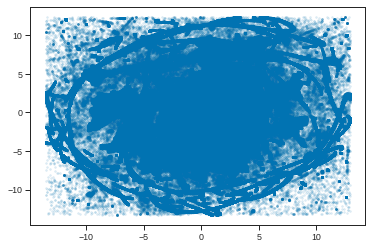

In [41]:
plt.scatter(embeddings_f_t_full[:, 0], embeddings_f_t_full[:, 1], alpha=0.1, s=3)

In [60]:
import datashader as ds
from colorcet import fire
from datashader import transfer_functions as tf

In [70]:
df = pd.DataFrame(np.hstack((embeddings_ftf, rd[:, -1].reshape(-1, 1))), columns=['dim1', 'dim2', 'ses', 'age'])
df['ses'] = df['ses'].astype('category')
agg = ds.Canvas().points(df, 'dim1', 'dim2', ds.by('ses', ds.count()))

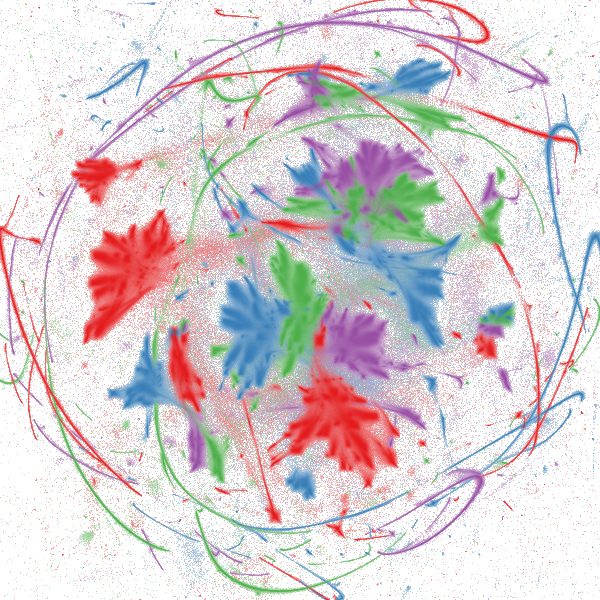

In [88]:
tf.shade(agg, how='eq_hist', min_alpha=80)

In [ ]:

dump(umap_model, config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'umap_embedding_5.model')

In [ ]:
umap_model = load(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'umap_embedding_5.model')

In [ ]:
embedding = umap_model.transform(lsd)

In [ ]:
embedding.shape

In [ ]:
np.save(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'umap_embedding_{step}.npy', embedding)

### Load

In [ ]:
step = 5

In [51]:
full_data = tables.open_file(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + 'safety/NIS_Pruned.h5', 'r')
# ind_mapping = tables.open_file(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + 'safety/NIS_2012_2014_proto_emb_red.h5', 'r').root.TRAIN

outcomes = full_data.root.outcomes
outcome_headers = full_data.root.outcome_headers[:].astype('str')

In [53]:
# oc = np.empty((tsne_fitted_test.shape[0], full_data.root.outcomes.shape[1]))
oc = []

for row in tqdm(full_data.root.outcomes.iterrows(start=0, step=step), total=full_data.root.outcomes.shape[0] / step):
    oc.append(row)

oc = np.array(oc)

rd = []
for row in tqdm(full_data.root.dataset.iterrows(start=0, step=step), total=full_data.root.dataset.shape[0] / step):
    rd.append(row)
rd = np.array(rd)

100%|██████████| 17369821/17369821.0 [17:41<00:00, 16366.13it/s] 
100%|██████████| 17369821/17369821.0 [01:56<00:00, 149307.80it/s]


In [54]:
oc[oc[:, 3] < 0, 3] = 0

In [55]:
oc[:, 4] = OrdinalEncoder().fit_transform(oc[:, 4].reshape(-1, 1)).reshape(-1)

In [56]:
oc[oc[:, 6] < 0, 6] = 0
oc[:, 6] = oc[:, 6].astype('float')

In [57]:
oco = np.copy(oc)
rdo = np.copy(rd)

In [18]:
embeddings = np.load(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'umap_embedding_5.npy')

In [ ]:
def filter_percentile(data, p=[0.5, 99.5]):
    lb, ub = np.percentile(data, p)
    lower = data >= lb
    upper = data <= ub
    return lower * upper

def filter_embeddings(embedding, oc, rd):
    d1filt = filter_percentile(embedding[:, 0])
    d2filt = filter_percentile(embedding[:, 1])
    keep = d1filt * d2filt
    
    return embedding[keep, :], oc[keep], rd[keep]

In [ ]:
embeddings, oc, rd = filter_embeddings(embeddings, oco, rdo)

In [20]:
def plot_latent_space(d, h, title, hue_norm=None):
    
    plt.style.use('bmh')
    plt.style.use("seaborn-ticks")
    
    sns.set_context("paper")
    sns.set_palette("colorblind")
    
    fig, ax = plt.subplots(figsize=(8, 8))
    
    title_params = {
        'fontsize' : 18,
        'fontweight' : 'bold',
        'pad' : 9,
    }
    
    xaxis_params = {
        'fontsize' : 12,
        'labelpad' : 6
    }
    
    yaxis_params = {
        'fontsize' : 12,
        'labelpad' : 6
    }
        
    if hue_norm is not None:
        axis = sns.scatterplot(x=d[:, 0], y=d[:, 1], hue=h, hue_norm=hue_norm, alpha=0.1, linewidth=0.1, ax=ax)
    else:
        axis = sns.scatterplot(x=d[:, 0], y=d[:, 1], hue=h, alpha=0.1, linewidth=0.1, ax=ax)
    
    axis.set_title(title, **title_params)
    axis.xaxis.set_visible(False)
    axis.yaxis.set_visible(False)
    
    fig.tight_layout(pad=3)
#     fig.savefig(f'/home/aisinai/work/repos/nis_patient_encoding/figures/supp_figure2_{title}_{step}.png', bbox_inches='tight')
    
#     with sns.plotting_context('talk'):
#         sns.set(style="white")
#         fig, ax = plt.subplots(figsize=(10, 10))
#         pl = sns.scatterplot(x=d[:, 0], y=d[:, 1], hue=h, alpha=1, linewidth=0.1, ax=ax).set(title='UMAP - Age')    
        

In [ ]:
lsd.shape

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


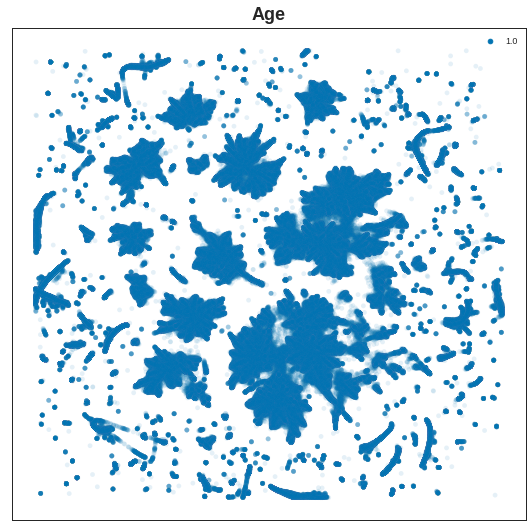

In [34]:
plot_latent_space(embeddings, np.ones((embeddings.shape[0], )), 'Age')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt

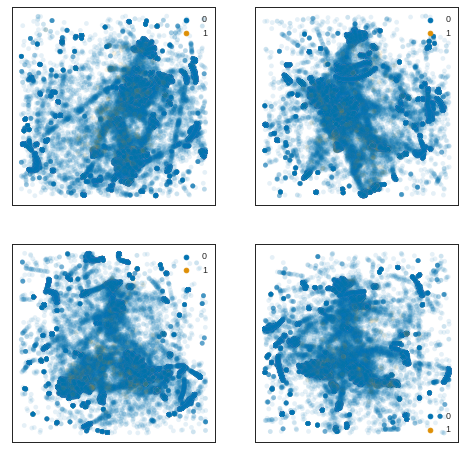

In [30]:
plt.style.use('bmh')
plt.style.use("seaborn-ticks")

sns.set_context("paper")
sns.set_palette("colorblind")

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes = axes.flatten()

for ax, level in zip(axes, range(1, 5)):
    b = rd[:, -1] == level
    
    r = rd[b, :]
    o = oc[b, :]
    e = embedding[b, :]
    
    g = sns.scatterplot(e[::, 0], e[::, 1], hue=o[::, 3], alpha=0.1, linewidth=0.1, ax=ax)
    g.xaxis.set_visible(False)
    g.yaxis.set_visible(False)

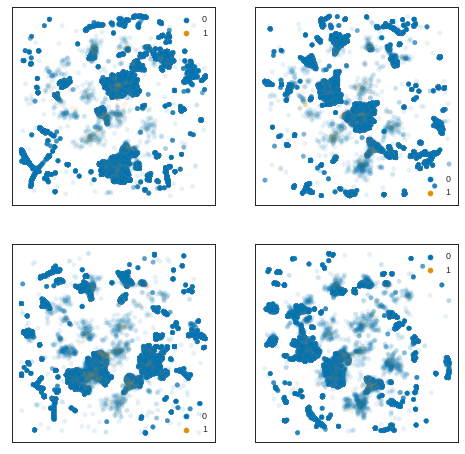

In [42]:
plt.style.use('bmh')
plt.style.use("seaborn-ticks")

sns.set_context("paper")
sns.set_palette("colorblind")

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes = axes.flatten()

for ax, level in zip(axes, range(1, 5)):
    b = rd[:, -1] == level
    
    r = rd[b, :]
    o = oc[b, :]
    e = embedding[b, :]
    
    g = sns.scatterplot(e[::, 0], e[::, 1], hue=o[::, 3], alpha=0.1, linewidth=0.1, ax=ax)
    g.xaxis.set_visible(False)
    g.yaxis.set_visible(False)

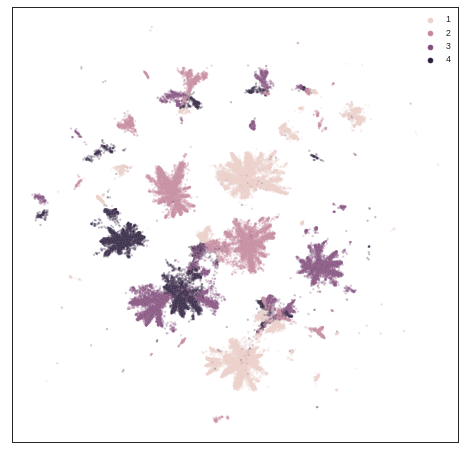

In [48]:
plt.style.use('bmh')
plt.style.use("seaborn-ticks")

sns.set_context("paper")
sns.set_palette("colorblind")

fig, ax = plt.subplots(figsize=(8, 8))

# Dead patients
b = oc[:, 3] == 1

# Subsets of dead patients
r = rd[b, :]
e = embedding[b, :]

# Plot only dead patients
g = sns.scatterplot(e[::, 0], e[::, 1], hue=r[::, -1], alpha=0.3, s=5, linewidth=0.1, ax=ax)
g.xaxis.set_visible(False)
g.yaxis.set_visible(False)

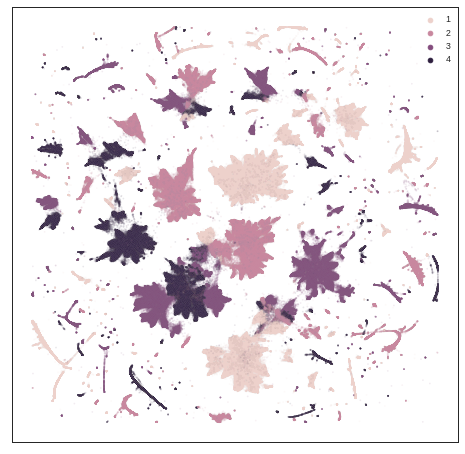

In [49]:
plt.style.use('bmh')
plt.style.use("seaborn-ticks")

sns.set_context("paper")
sns.set_palette("colorblind")

fig, ax = plt.subplots(figsize=(8, 8))

# Dead patients
b = oc[:, 3] == 0

# Subsets of dead patients
r = rd[b, :]
e = embedding[b, :]

# Plot only dead patients
g = sns.scatterplot(e[::, 0], e[::, 1], hue=r[::, -1], alpha=0.1, s=3, linewidth=0.1, ax=ax)
g.xaxis.set_visible(False)
g.yaxis.set_visible(False)

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:37: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:37: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/opt/conda/lib/python3.7/site-packages/IPython

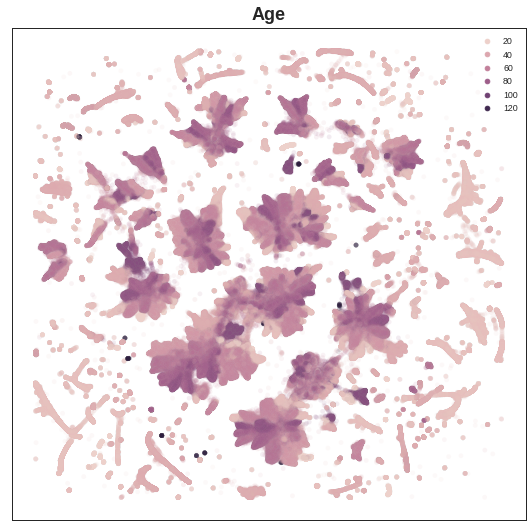

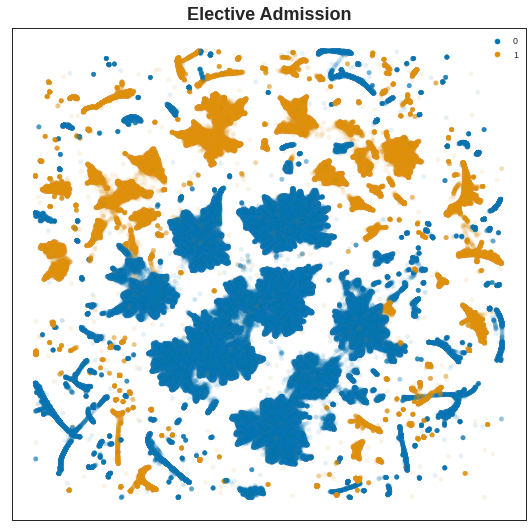

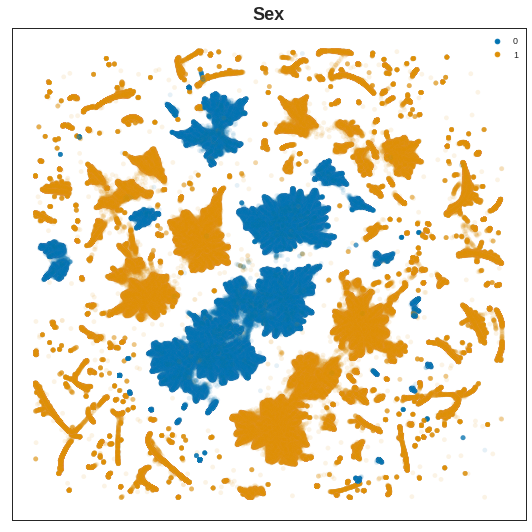

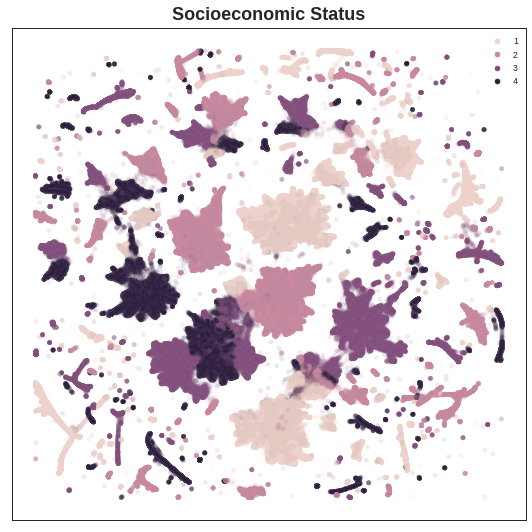

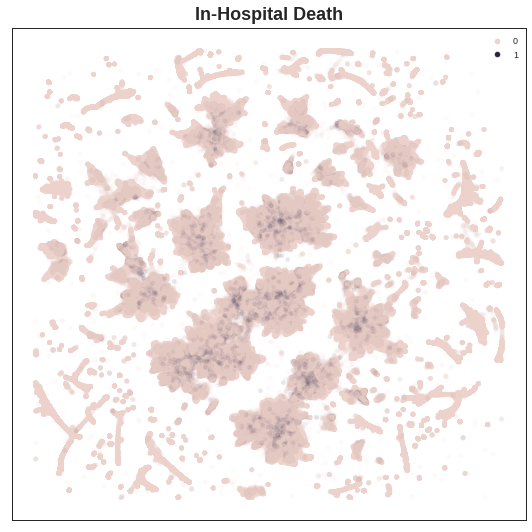

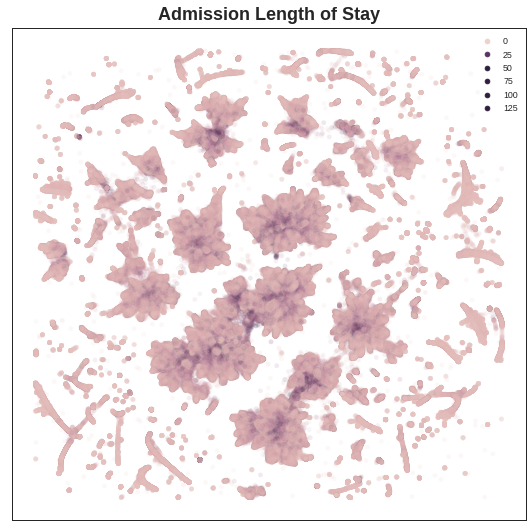

In [28]:
plot_latent_space(embedding, rd[:, 0], 'Age')
plot_latent_space(embedding, rd[:, full_data.root.headers[:].tolist().index(b'ELECTIVE')], 'Elective Admission')
plot_latent_space(embedding, rd[:, full_data.root.headers[:].tolist().index(b'FEMALE')], 'Sex')
plot_latent_space(embedding, rd[:, -1], 'Socioeconomic Status')
plot_latent_space(embedding, oc[:, 3], 'In-Hospital Death', hue_norm=(0, 1))
plot_latent_space(embedding, oc[:, 6], 'Admission Length of Stay', hue_norm=(0, 30))

In [1]:
plot_latent_space(embedding, rd[:, full_data.root.headers[:].tolist().index(b'FEMALE')], 'Sex')

NameError: name 'plot_latent_space' is not defined

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


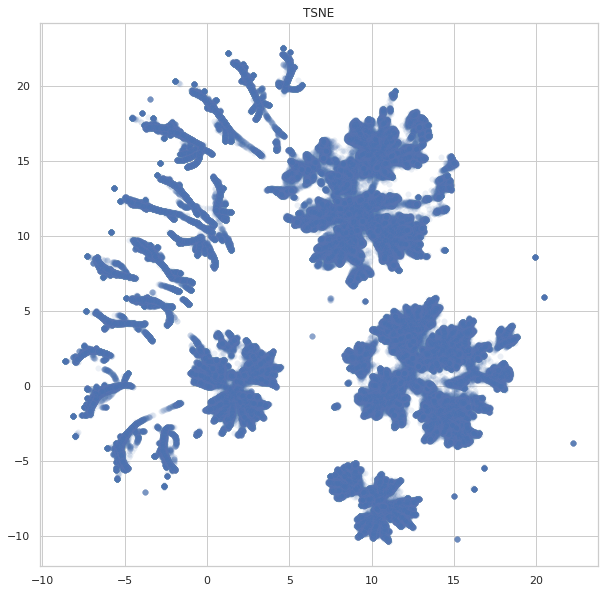

In [31]:
# 25
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


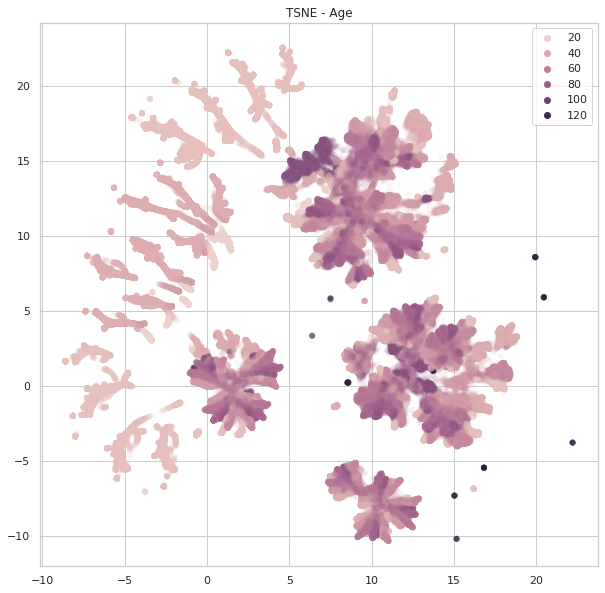

In [41]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=rd[:, 0], alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - Age')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


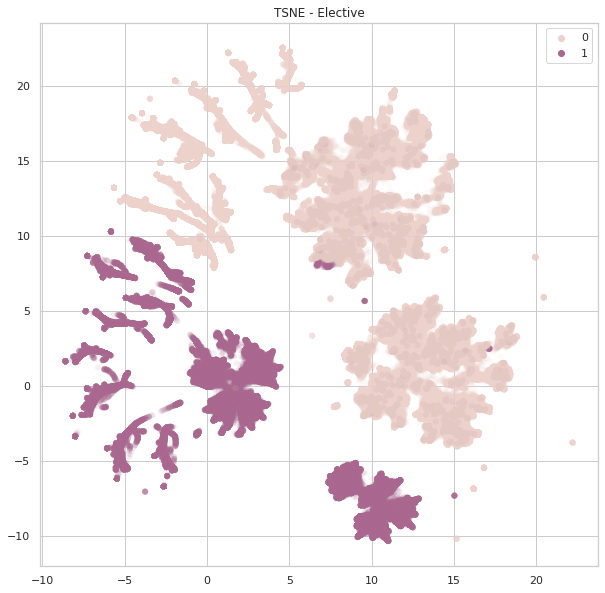

In [42]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=rd[:, full_data.root.headers[:].tolist().index(b'ELECTIVE')], hue_norm=(0, 2), alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - Elective')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


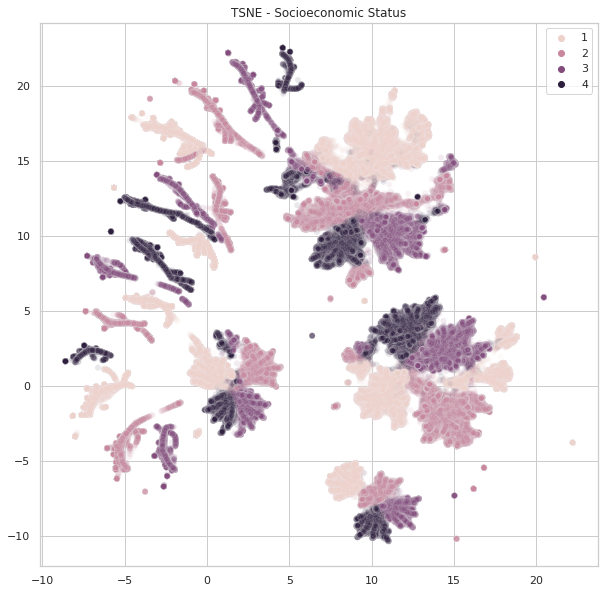

In [43]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=rd[:, -1], alpha=0.1, linewidth=0.5, ax=ax).set(title='TSNE - Socioeconomic Status')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


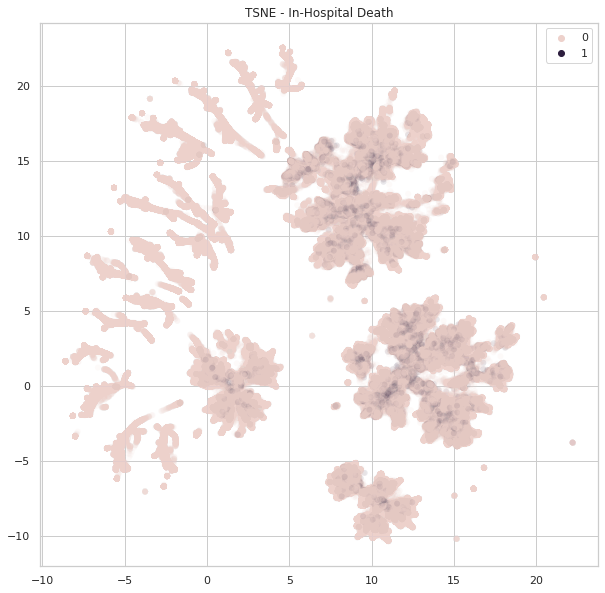

In [44]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=oc[:, 3], hue_norm=(0, 1), alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - In-Hospital Death')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


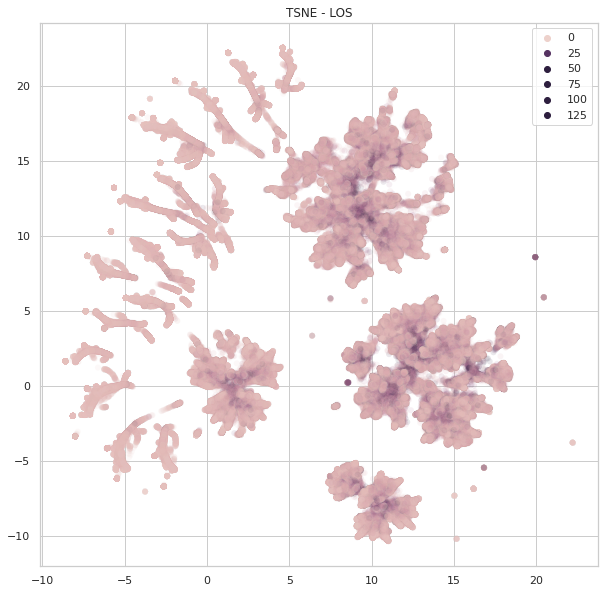

In [45]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=oc[:, 6], hue_norm=(0, 30), alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - LOS')

In [46]:
lsd = []
step = 5
for row in tqdm(latent_space.root.ls.iterrows(start=0, step=step), total=latent_space.root.ls.shape[0] / step):
    lsd.append(row)
    
lsd = np.array(lsd)

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
3473965it [01:03, 54453.58it/s]                               


In [47]:
full_data = tables.open_file(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + 'safety/NIS_Pruned.h5', 'r')
# ind_mapping = tables.open_file(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + 'safety/NIS_2012_2014_proto_emb_red.h5', 'r').root.TRAIN

outcomes = full_data.root.outcomes
outcome_headers = full_data.root.outcome_headers[:].astype('str')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [48]:
# oc = np.empty((tsne_fitted_test.shape[0], full_data.root.outcomes.shape[1]))
oc = []

for row in tqdm(full_data.root.outcomes.iterrows(start=0, step=step), total=full_data.root.outcomes.shape[0] / step):
    oc.append(row)

oc = np.array(oc)

rd = []
for row in tqdm(full_data.root.dataset.iterrows(start=0, step=step), total=full_data.root.dataset.shape[0] / step):
    rd.append(row)
rd = np.array(rd)

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
3473965it [00:41, 84069.59it/s]                               
3473965it [01:49, 31797.62it/s]                               


In [49]:
oc[oc[:, 3] < 0, 3] = 0

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [50]:
oc[:, 4] = OrdinalEncoder().fit_transform(oc[:, 4].reshape(-1, 1)).reshape(-1)

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [51]:
oc[oc[:, 6] < 0, 6] = 0
oc[:, 6] = oc[:, 6].astype('float')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [54]:
oco = np.copy(oc)
rdo = np.copy(rd)

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [18]:
embedding = cuUMpaAP(verbose=True).fit_transform(lsd)

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [19]:
np.save(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'umap_embedding_{step}.npy', embedding)

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [52]:
embedding = np.load(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'umap_embedding_{step}.npy')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [53]:
def filter_percentile(data, p=[0.5, 99.5]):
    lb, ub = np.percentile(data, p)
    lower = data >= lb
    upper = data <= ub
    return lower * upper

def filter_embeddings(embedding, oc, rd):
    d1filt = filter_percentile(embedding[:, 0])
    d2filt = filter_percentile(embedding[:, 1])
    keep = d1filt * d2filt
    
    return embedding[keep, :], oc[keep], rd[keep]

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [55]:
embedding, oc, rd = filter_embeddings(embedding, oco, rdo)

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


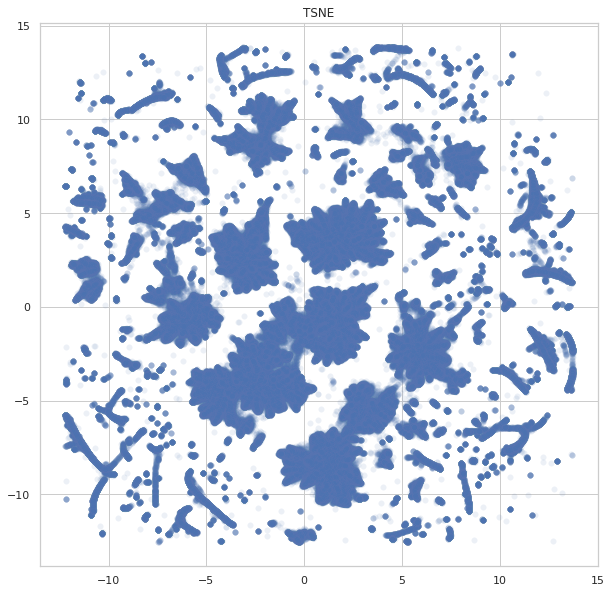

In [59]:
# 5
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/opt/conda/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


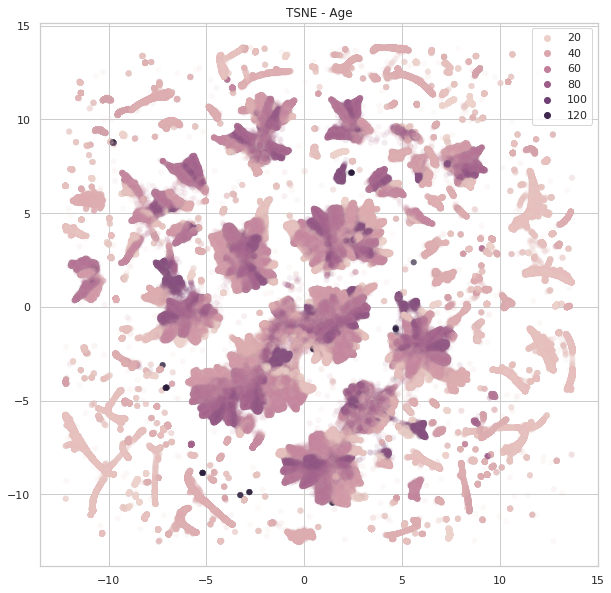

In [60]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=rd[:, 0], alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - Age')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


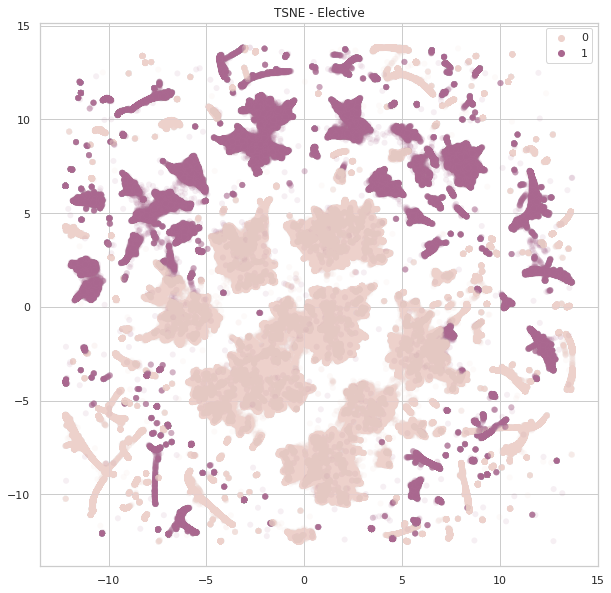

In [61]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=rd[:, full_data.root.headers[:].tolist().index(b'ELECTIVE')], hue_norm=(0, 2), alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - Elective')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/opt/conda/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


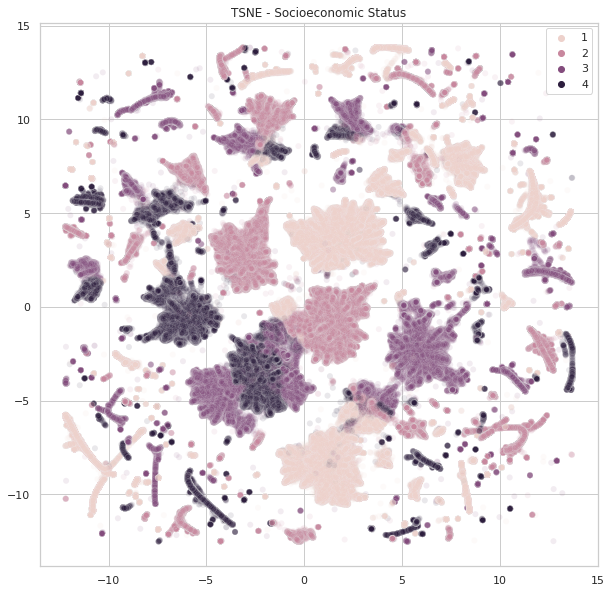

In [62]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=rd[:, -1], alpha=0.1, linewidth=0.5, ax=ax).set(title='TSNE - Socioeconomic Status')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


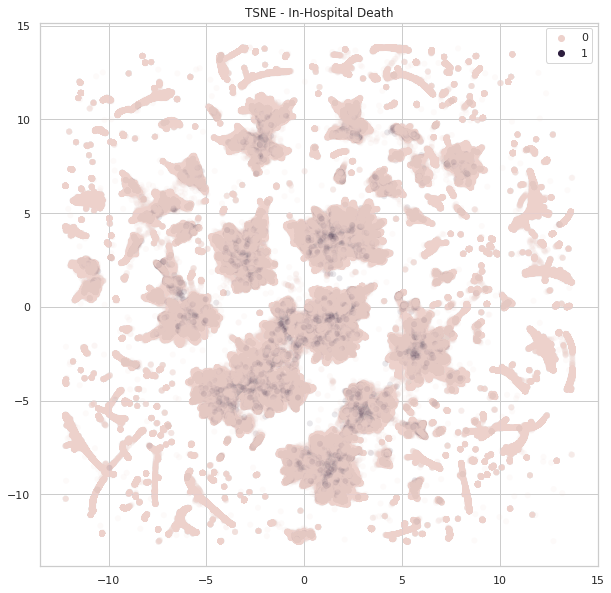

In [63]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=oc[:, 3], hue_norm=(0, 1), alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - In-Hospital Death')

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/opt/conda/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


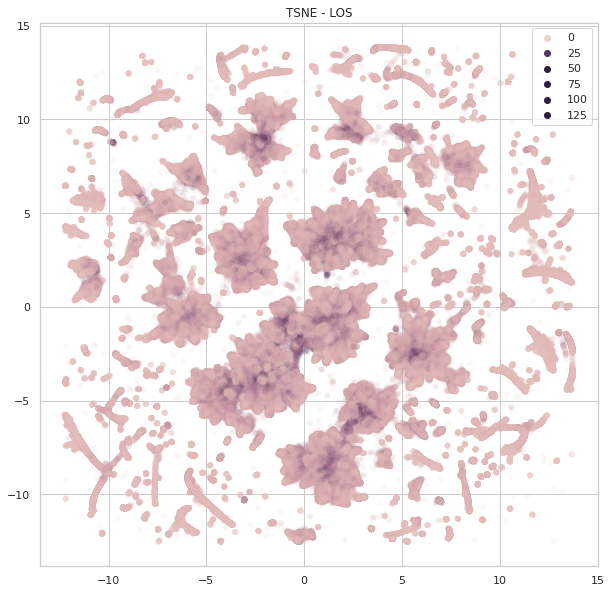

In [64]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=oc[:, 6], hue_norm=(0, 30), alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - LOS')

In [48]:
tsne_fitted = tsne.fit_transform(lsd)
np.savetxt(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'tsne_{step}.npy', tsne_fitted)

In [29]:
config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER']

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'/home/aisinai/work/repos/nis_patient_encoding/data/raw/'

In [27]:
# tsne_fitted_test = tsne_fitted
tsne_fitted = np.load(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + f'tsne_10.npy', allow_pickle=True)

/opt/conda/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


OSError: Failed to interpret file '/home/aisinai/work/repos/nis_patient_encoding/data/raw/tsne_10.npy' as a pickle

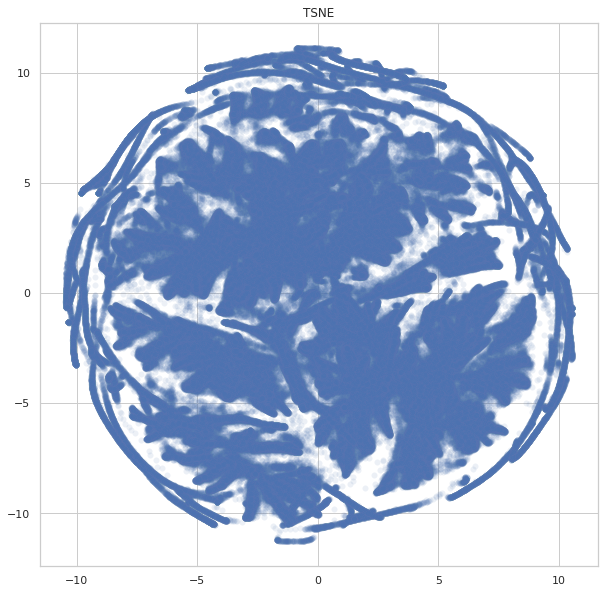

In [50]:
# 20
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=tsne_fitted[:, 0], y=tsne_fitted[:, 1], alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE')

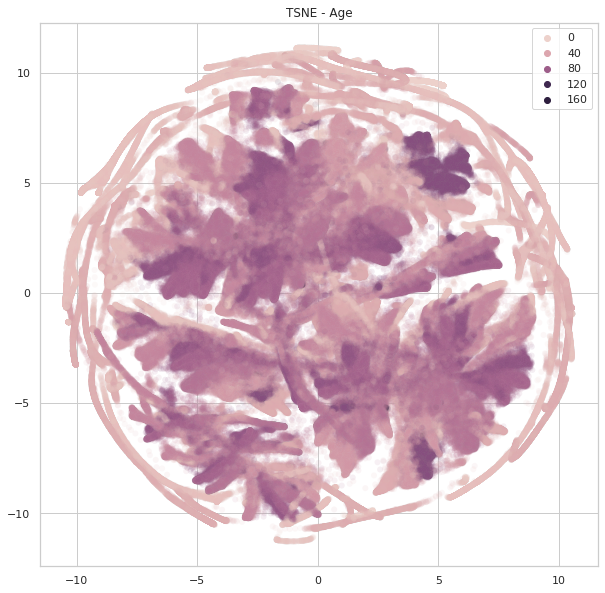

In [56]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=tsne_fitted_test[:, 0], y=tsne_fitted_test[:, 1], hue=rd[:, 0], alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - Age')

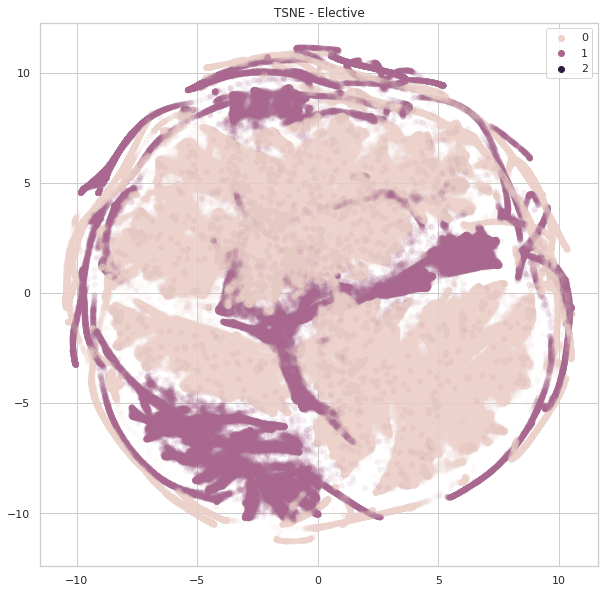

In [71]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=tsne_fitted_test[:, 0], y=tsne_fitted_test[:, 1], hue=rd[:, full_data.root.headers[:].tolist().index(b'ELECTIVE')], hue_norm=(0, 2), alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - Elective')

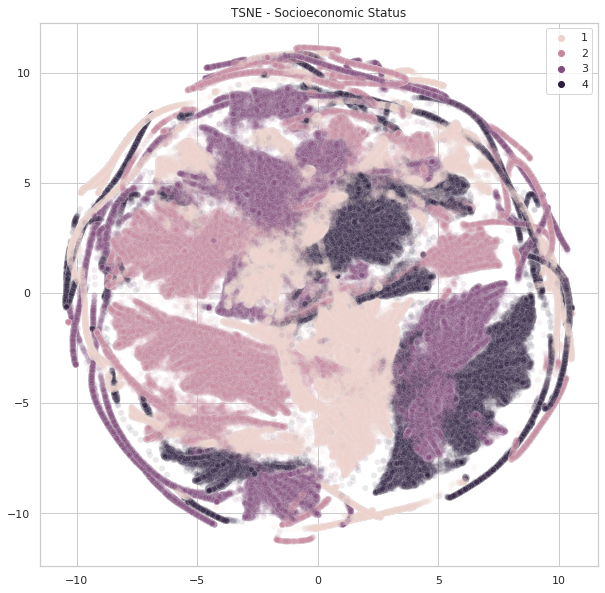

In [66]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=tsne_fitted_test[:, 0], y=tsne_fitted_test[:, 1], hue=rd[:, -1], alpha=0.1, linewidth=0.5, ax=ax).set(title='TSNE - Socioeconomic Status')

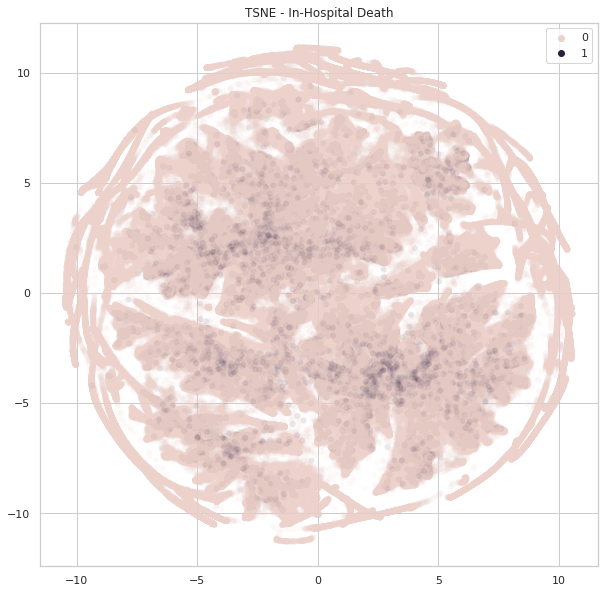

In [69]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=tsne_fitted_test[:, 0], y=tsne_fitted_test[:, 1], hue=oc[:, 3], hue_norm=(0, 1), alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - In-Hospital Death')

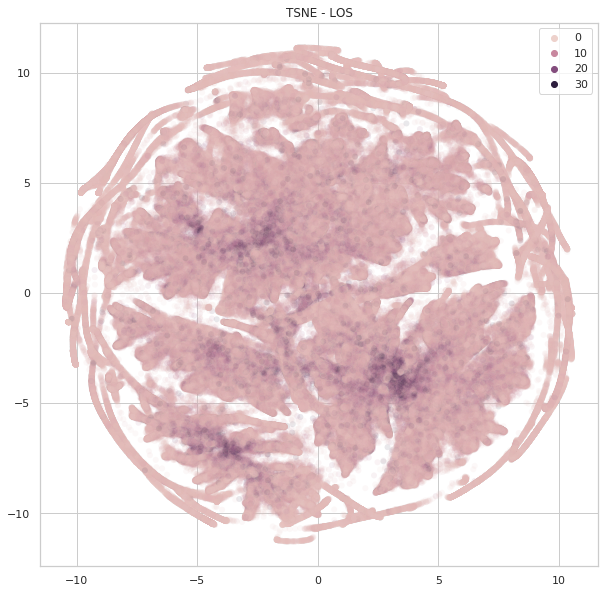

In [68]:
with sns.plotting_context('poster'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(x=tsne_fitted_test[:, 0], y=tsne_fitted_test[:, 1], hue=oc[:, 6], hue_norm=(0, 30), alpha=0.1, linewidth=0.1, ax=ax).set(title='TSNE - LOS')

### Outcomes

In [22]:
config_ts['global']

{'DEVICE': 'cuda:0',
 'PROJECT_DIR': '/home/aisinai/work/repos/nis_patient_encoding/',
 'DATA_FOLDER': 'data/raw/',
 'PSM_RESULTS': 'study_type/savr_tavr/psm_result/',
 'STUDY': 'study_type/savr_tavr/',
 'REFERENCES': ['https://www.onlinejacc.org/content/71/21/2489',
  'https://www.nejm.org/doi/full/10.1056/NEJMoa1816885?query=recirc_curatedRelated_article',
  'https://www.nejm.org/doi/full/10.1056/NEJMoa1814052']}

In [23]:
full_data = tables.open_file(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + 'safety/NIS_Pruned.h5', 'r')
# ind_mapping = tables.open_file(config_ts['global']['PROJECT_DIR'] + config_ts['global']['DATA_FOLDER'] + 'safety/NIS_2012_2014_proto_emb_red.h5', 'r').root.TRAIN

outcomes = full_data.root.outcomes
outcome_headers = full_data.root.outcome_headers

In [ ]:
fd = full_data.root.dataset[::100, :]

### t-SNE

In [17]:
latent_representation = ae.latent_representation(samp_batch).detach()

In [21]:
from sklearn.manifold import TSNE
latent_space_embedded = TSNE(n_components=2, random_state=0)

In [22]:
latent_space_embedded.fit(latent_representation)

TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
     method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
     n_components=2, n_iter=1000, n_iter_without_progress=300, n_jobs=None,
     perplexity=30.0, random_state=0, verbose=0)

[Text(0.5, 1.0, 'TSNE')]

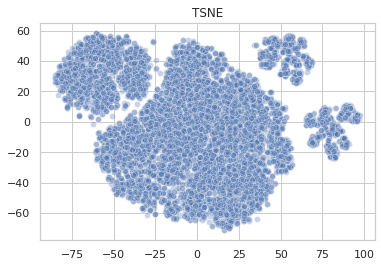

In [23]:
import seaborn as sns
sns.set(style="whitegrid")
sns.scatterplot(*latent_space_embedded.embedding_.T, alpha=0.3).set(title='TSNE')

Color based on outcome's data.

In [24]:
outcome_headers[:]

array([b'APRDRG', b'APRDRG_Risk_Mortality', b'APRDRG_Severity', b'DIED',
       b'DISPUNIFORM', b'DRG', b'LOS', b'TOTCHG'], dtype='|S21')

In [25]:
batch_mapping = ind_mapping[:latent_representation.shape[0]]
batch_outcomes = outcomes[batch_mapping, :]

In [38]:
batch_outcomes[batch_outcomes[:, 3] == -128, 3] = 0

In [42]:
db.headers

array([b'AGE', b'CHRONB01', b'CHRONB02', b'CHRONB03', b'CHRONB04',
       b'CHRONB05', b'CHRONB06', b'CHRONB07', b'CHRONB08', b'CHRONB09',
       b'CHRONB10', b'CHRONB11', b'CHRONB12', b'CHRONB13', b'CHRONB14',
       b'CHRONB15', b'CHRONB16', b'CHRONB17', b'CHRONB18', b'CHRONB19',
       b'CHRONB20', b'CHRONB21', b'CHRONB22', b'CHRONB23', b'CHRONB24',
       b'CHRONB25', b'CHRONB26', b'CHRONB27', b'CHRONB28', b'CHRONB29',
       b'CHRONB30', b'DX01', b'DX02', b'DX03', b'DX04', b'DX05', b'DX06',
       b'DX07', b'DX08', b'DX09', b'DX10', b'DX11', b'DX12', b'DX13',
       b'DX14', b'DX15', b'DX16', b'DX17', b'DX18', b'DX19', b'DX20',
       b'DX21', b'DX22', b'DX23', b'DX24', b'DX25', b'DX26', b'DX27',
       b'DX28', b'DX29', b'DX30', b'ECODE01', b'ECODE02', b'ECODE03',
       b'ECODE04', b'ELECTIVE', b'FEMALE', b'HCUP_ED', b'PR01', b'PR02',
       b'PR03', b'PR04', b'PR05', b'PR06', b'PR07', b'PR08', b'PR09',
       b'PR10', b'PR11', b'PR12', b'PR13', b'PR14', b'PR15', b'TRAN_IN',
   

[Text(0.5, 1.0, 'TSNE - Mortality')]

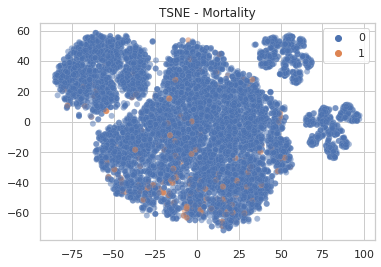

In [39]:
sns.scatterplot(*latent_space_embedded.embedding_.T, hue=batch_outcomes[:, 3], alpha=0.5, linewidth=0.1).set(title='TSNE - Mortality')

[Text(0.5, 1.0, 'TSNE - APRDRG_Mortality_Risk')]

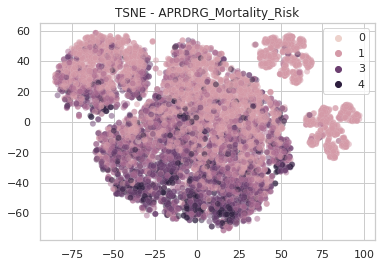

In [27]:
sns.scatterplot(*latent_space_embedded.embedding_.T, hue=batch_outcomes[:, 1], alpha=0.5, linewidth=0.1).set(title='TSNE - APRDRG_Mortality_Risk')

[Text(0.5, 1.0, 'TSNE - LOS')]

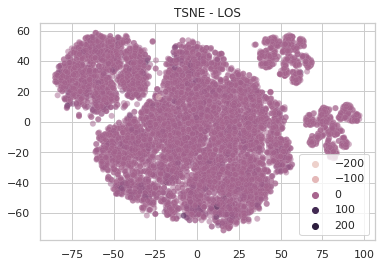

In [28]:
sns.scatterplot(*latent_space_embedded.embedding_.T, hue=batch_outcomes[:, 6], alpha=0.5, linewidth=0.1).set(title='TSNE - LOS')

[Text(0.5, 1.0, 'TSNE - Disposition')]

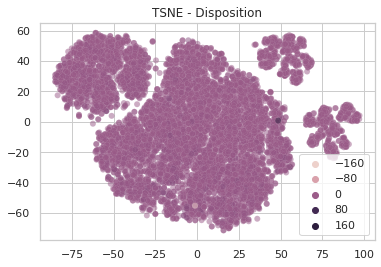

In [29]:
sns.scatterplot(*latent_space_embedded.embedding_.T, hue=batch_outcomes[:, 4], alpha=0.5, linewidth=0.1).set(title='TSNE - Disposition')

[Text(0.5, 1.0, 'TSNE - Age')]

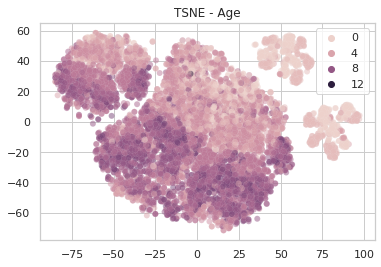

In [41]:
sns.scatterplot(*latent_space_embedded.embedding_.T, hue=samp_batch[:, 0], alpha=0.5, linewidth=0.1).set(title='TSNE - Age')

In [44]:
headers = db.headers.tolist()

[Text(0.5, 1.0, 'TSNE - Elective')]

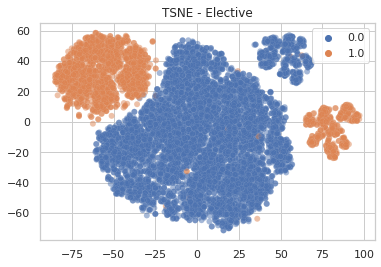

In [51]:
sns.scatterplot(*latent_space_embedded.embedding_.T, hue=samp_batch[:, headers.index(b'ELECTIVE')], alpha=0.5, linewidth=0.1).set(title='TSNE - Elective')

### PCA

In [30]:
from sklearn.decomposition import PCA
latent_space_pca = PCA(n_components=2, random_state=0, whiten=True)

In [31]:
latent_space_pca.fit(latent_representation)
pca_transform = latent_space_pca.transform(latent_representation).T

[Text(0.5, 1.0, 'PCA')]

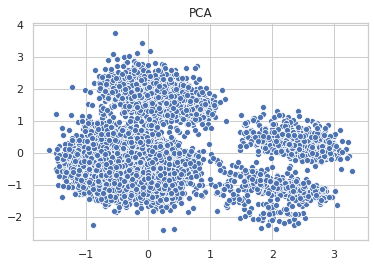

In [32]:
sns.set(style="whitegrid")
sns.scatterplot(*pca_transform).set(title='PCA')

[Text(0.5, 1.0, 'TSNE - Mortality')]

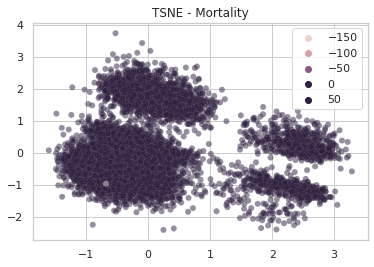

In [33]:
sns.scatterplot(*pca_transform, hue=batch_outcomes[:, 3], alpha=0.5, linewidth=0.1).set(title='TSNE - Mortality')

[Text(0.5, 1.0, 'TSNE - APRDRG')]

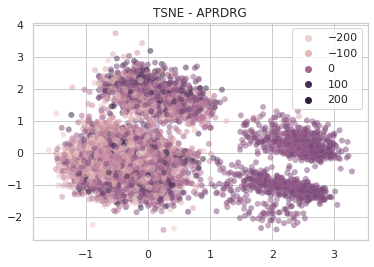

In [34]:
sns.scatterplot(*pca_transform, hue=batch_outcomes[:, 0], alpha=0.5, linewidth=0.1).set(title='TSNE - APRDRG')

[Text(0.5, 1.0, 'TSNE - APRDRG_Mortality_Risk')]

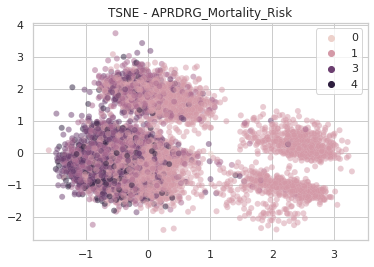

In [35]:
sns.scatterplot(*pca_transform, hue=batch_outcomes[:, 1], alpha=0.5, linewidth=0.1).set(title='TSNE - APRDRG_Mortality_Risk')

[Text(0.5, 1.0, 'TSNE - LOS')]

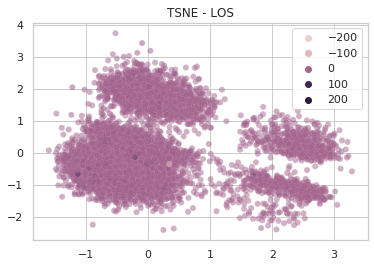

In [36]:
sns.scatterplot(*pca_transform, hue=batch_outcomes[:, 6], alpha=0.5, linewidth=0.1).set(title='TSNE - LOS')

[Text(0.5, 1.0, 'TSNE - Disposition')]

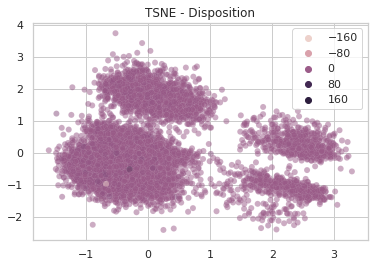

In [37]:
sns.scatterplot(*pca_transform, hue=batch_outcomes[:, 4], alpha=0.5, linewidth=0.1).set(title='TSNE - Disposition')